In [1]:
library(Seurat)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject



In [2]:
load("DFU_data.list.RData")

In [3]:
features <- SelectIntegrationFeatures(object.list = DFU_data.list)


In [4]:
anchors <- FindIntegrationAnchors(object.list = DFU_data.list, anchor.features = features, normalization.method = "LogNormalize", dims = 1:15, reduction="cca")
cca.merged.obj <- IntegrateData(anchorset = anchors) 

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 4870 anchors

Filtering anchors

	Retained 3792 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 3560 anchors

Filtering anchors

	Retained 2849 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 3076 anchors

Filtering anchors

	Retained 2384 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 3416 anchors

Filtering anchors

	Retained 3166 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2774 anchors

Filtering anchors

	Retained 2501 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 3173 anchors

Fi

In [ ]:
cca.merged.obj$sample <- as.vector(sapply(cca.merged.obj$orig.ident, function(x){strsplit(x, "_")[[1]][2]}))

In [7]:
DefaultAssay(cca.merged.obj) <- "integrated" 

In [8]:
cca.merged.obj <- ScaleData(cca.merged.obj, verbose = FALSE)
cca.merged.obj <- RunPCA(cca.merged.obj, verbose = FALSE)

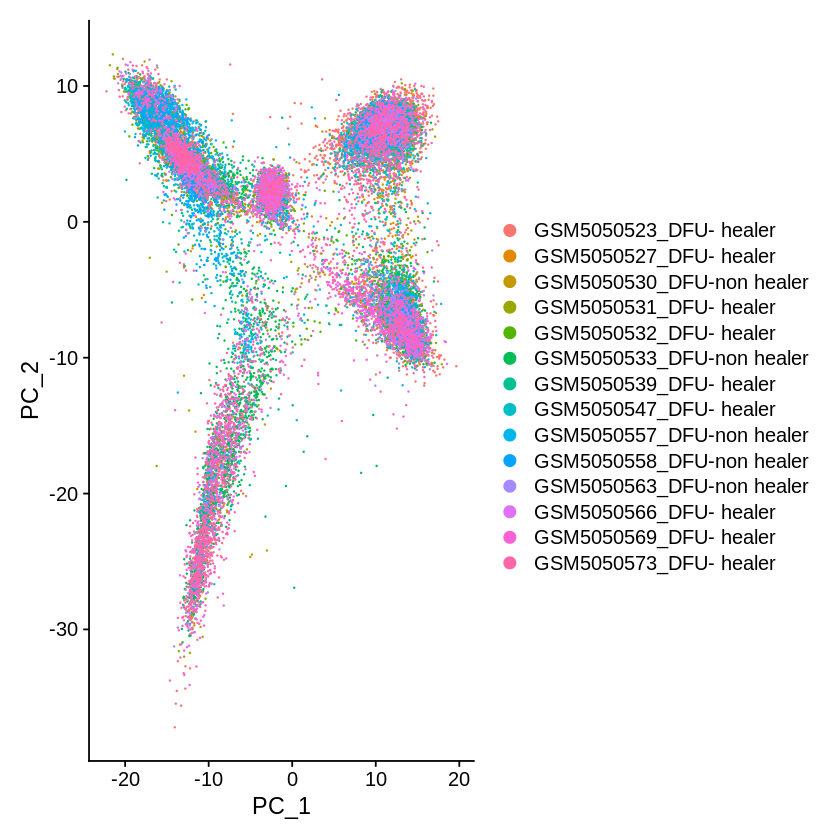

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 29319
Number of edges: 1060727

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9617
Number of communities: 7
Elapsed time: 3 seconds


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
09:54:57 UMAP embedding parameters a = 0.9922 b = 1.112

09:54:57 Read 29319 rows and found 15 numeric columns

09:54:57 Using Annoy for neighbor search, n_neighbors = 30

09:54:57 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:54:59 Writing NN index file to temp file /tmp/RtmptKjMU5/file14dec1b8b1932

09:54:59 Searching Annoy index using 1 thread, search_k = 3000

09:55:06 Annoy recall = 100%

09:55:07 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors

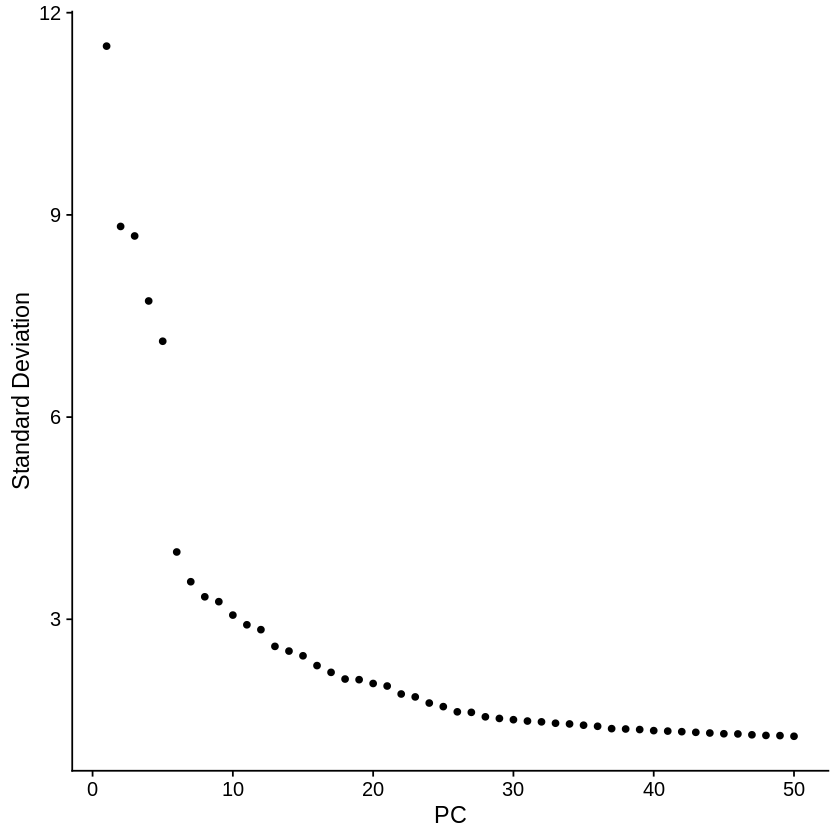

In [9]:
DimPlot(cca.merged.obj, reduction = "pca")
ElbowPlot(cca.merged.obj, ndims=50)

cca.merged.obj <- FindNeighbors(cca.merged.obj, reduction = "pca", dims = 1:15)
cca.merged.obj <- FindClusters(cca.merged.obj, resolution = 0.2)
cca.merged.obj <- RunUMAP(cca.merged.obj, reduction = "pca", dims = 1:15)
cca.merged.obj <- RunTSNE(cca.merged.obj, reduction = "pca", dims = 1:15)

In [10]:
p1 <- DimPlot(cca.merged.obj, reduction = "umap", label=T) + NoLegend()
p2 <- DimPlot(cca.merged.obj, reduction = "tsne", label=T) + NoLegend()

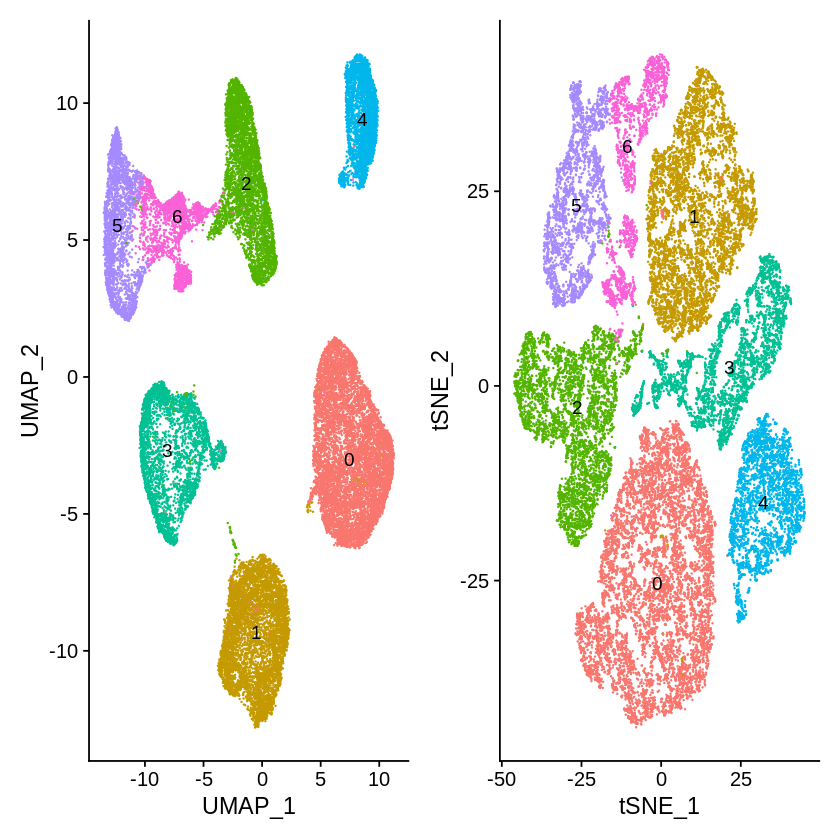

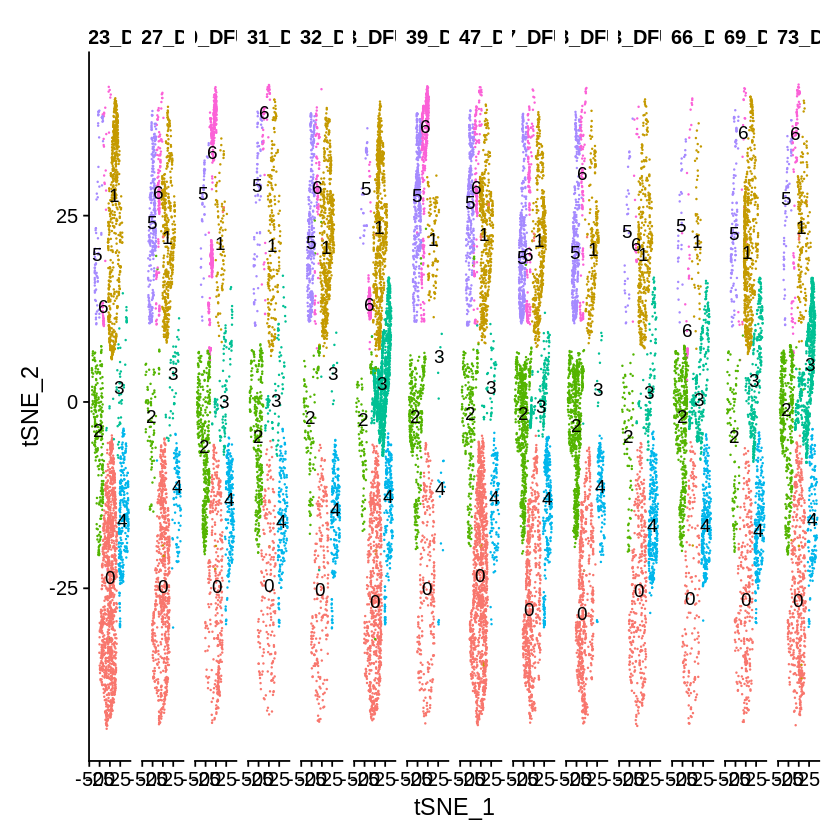

In [11]:
p1+p2
p3 <- DimPlot(cca.merged.obj, reduction = "tsne", label=T,  split.by = "orig.ident") + NoLegend()
p3



In [12]:
options(repr.plot.width = 20, repr.plot.height = 8)

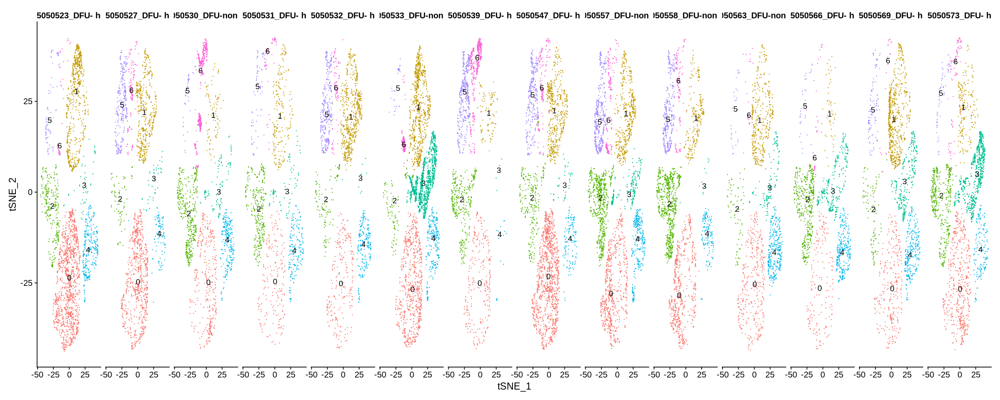

In [13]:
p3

In [14]:
cca.merged.obj$major_group <- ifelse(grepl("_DFU-non healer$", cca.merged.obj$orig.ident), "DFU-non healer", "DFU- healer")

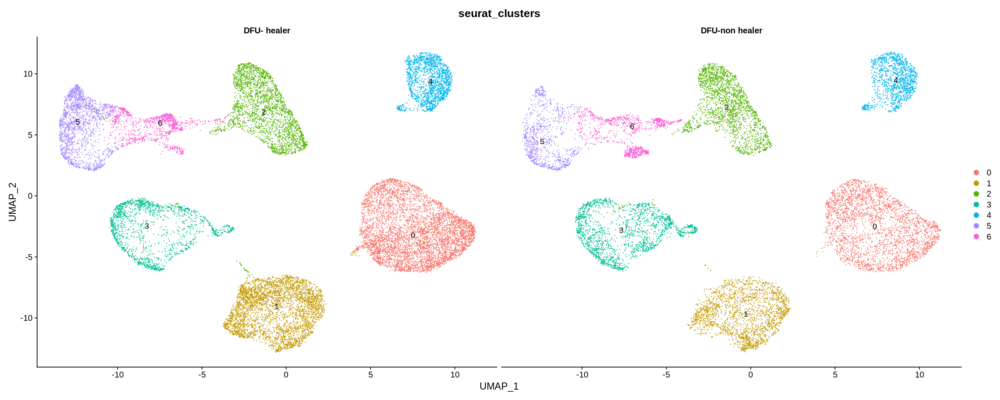

In [15]:
DimPlot(cca.merged.obj, 
        group.by = 'seurat_clusters', 
        split.by = "major_group", 
        label = TRUE) # Add labels to clusters

In [16]:
cluster.markers <- FindAllMarkers(obj=cca.merged.obj,
                                only.pos=FALSE,
                                min.pct=0.25,
                                logfc.thrshold=logFCfilter)


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6



In [17]:
 #Define your filter conditions
logFCfilter <- 1.0  # You can change this value to your desired threshold
adjPvalfilter <- 0.05  # You can change this value to your desired threshold

# Subset the data frame using the filter conditions
subset_markers <- cluster.markers[
  (abs(as.numeric(as.vector(cluster.markers$avg_log2FC))) > logFCfilter) &
  (as.numeric(as.vector(cluster.markers$p_val_adj)) < adjPvalfilter), ]



In [18]:
sig.markers <- cluster.markers[(abs(as.numeric(as.vector(cluster.markers$avg_log2FC))))>logFCfilter & as.numeric((as.vector(cluster.markers$p_val_adj))<adjPvalfilter),]

In [19]:
install.packages("openxlsx")
install.packages("dplyr")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [20]:
library(openxlsx)
library(dplyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [21]:
top10 <- cluster.markers %>% group_by(cluster) %>% top_n(n=10,wt=avg_log2FC)

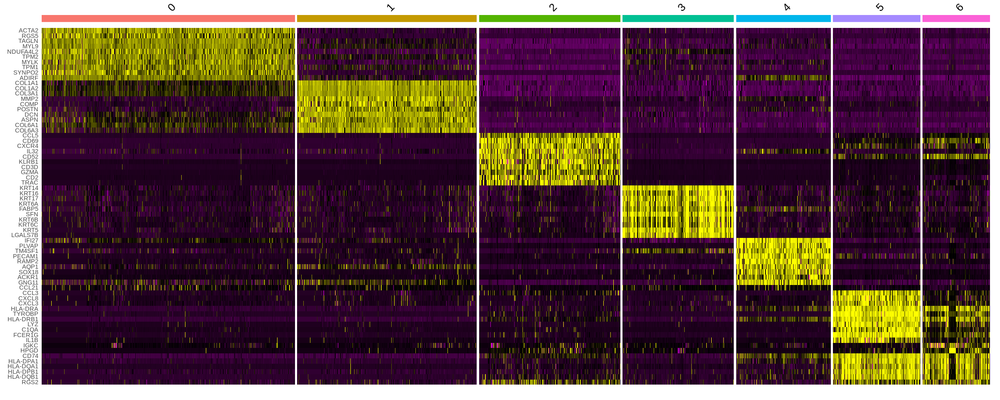

In [22]:
# Check if the object cca.merged.obj exists
if (exists("cca.merged.obj")) {
  # If it exists, you can proceed with the DoHeatmap function
  DoHeatmap(obj = cca.merged.obj, features = top10$gene) + NoLegend()
} else {
  # If it doesn't exist, you may need to load or create it
  print("cca.merged.obj does not exist in the current environment.")
}

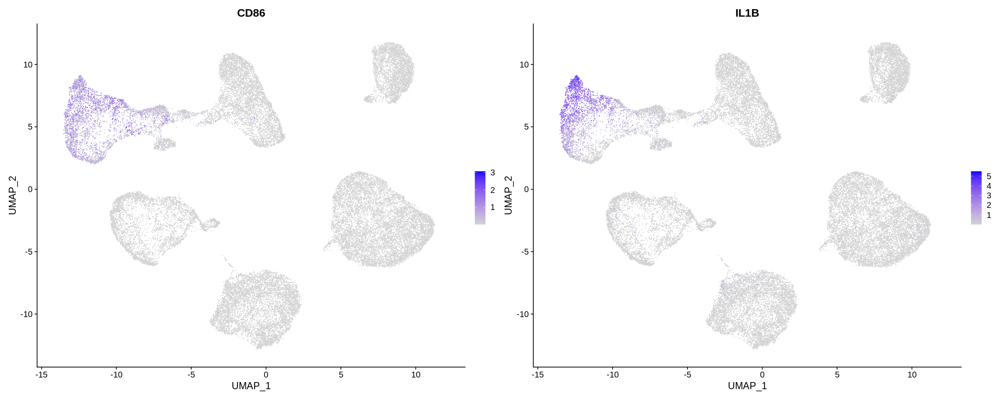

In [23]:
FeaturePlot(cca.merged.obj, features = c('CD86', 'IL1B'), min.cutoff = "q9") #macrophge 5

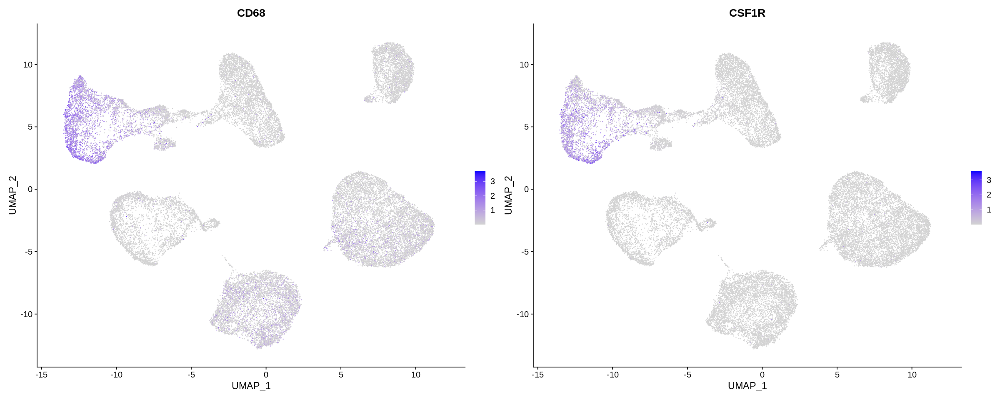

In [24]:
FeaturePlot(cca.merged.obj, features = c('CD68', 'CSF1R'), min.cutoff = "q9")

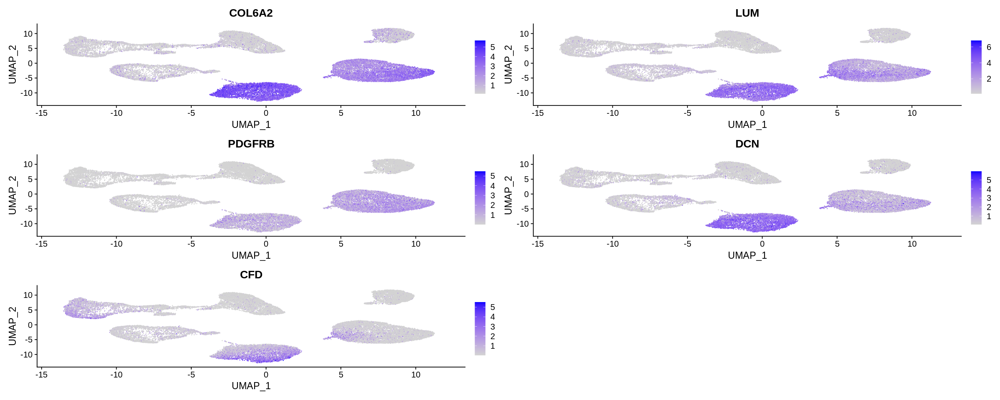

In [25]:
FeaturePlot(cca.merged.obj, features = c('COL6A2', 'LUM','PDGFRB','DCN','CFD'), min.cutoff = "q9") #Fibroblast 1

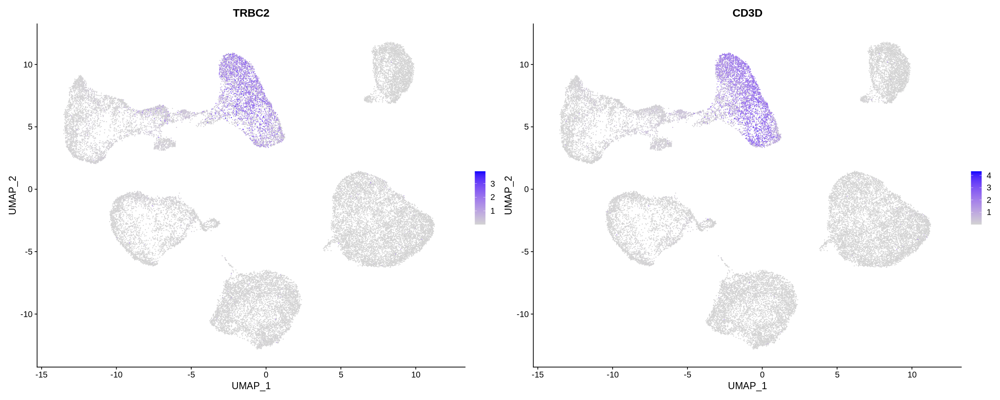

In [26]:
FeaturePlot(cca.merged.obj, features = c('TRBC2', 'CD3D'), min.cutoff = "q9") #Tcell 2

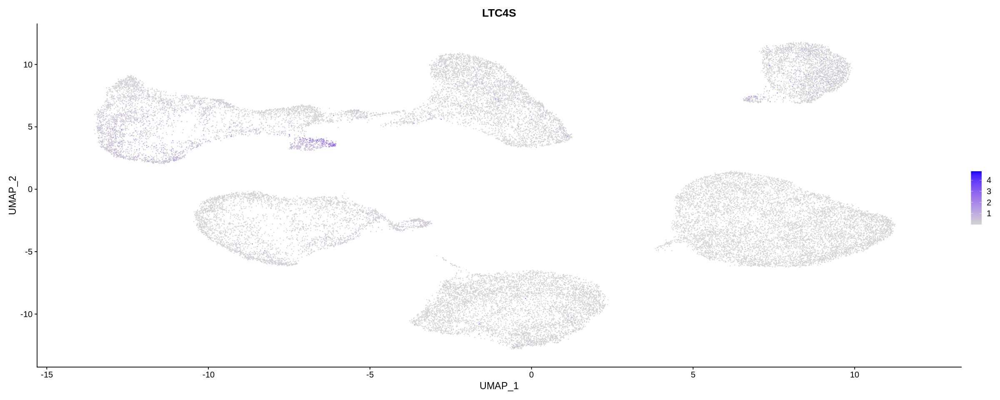

In [27]:
FeaturePlot(cca.merged.obj, features = c('LTC4S'), min.cutoff = "q9") #Mast cell 

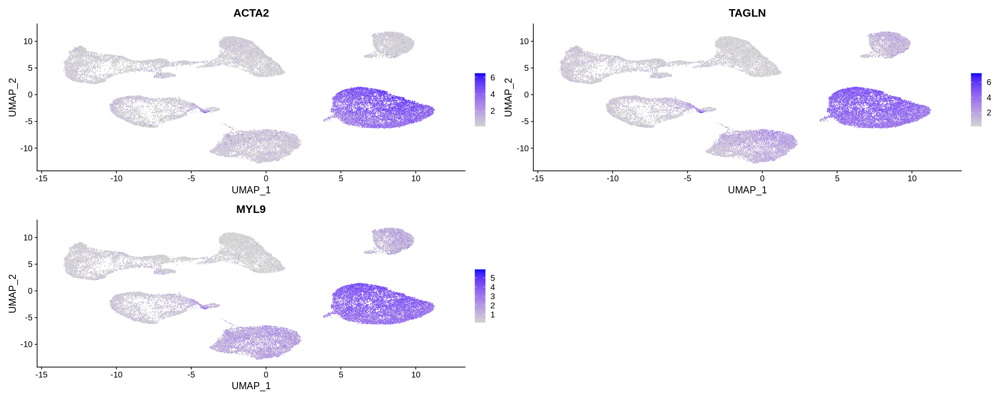

In [28]:
FeaturePlot(cca.merged.obj, features = c('ACTA2','TAGLN','MYL9'), min.cutoff = "q9") #SMC 0

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: IVT”


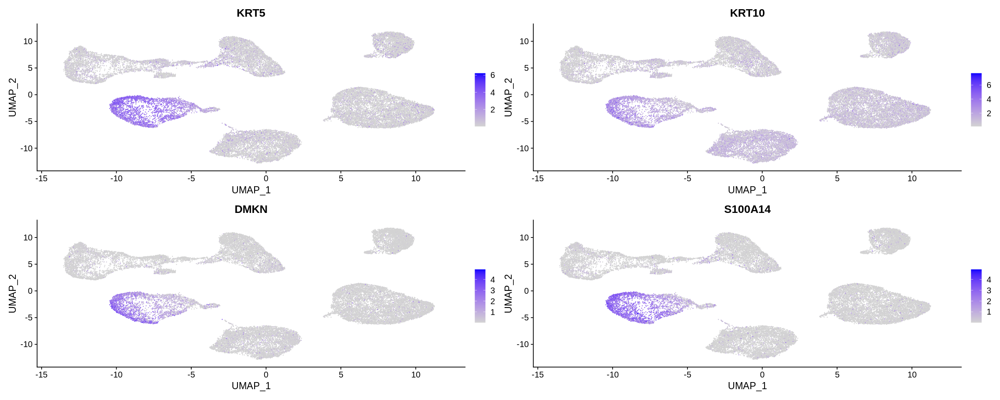

In [29]:
FeaturePlot(cca.merged.obj, features = c('KRT5', 'KRT10','IVT','DMKN','S100A14'), min.cutoff = "q9") #Keratinocyte 3

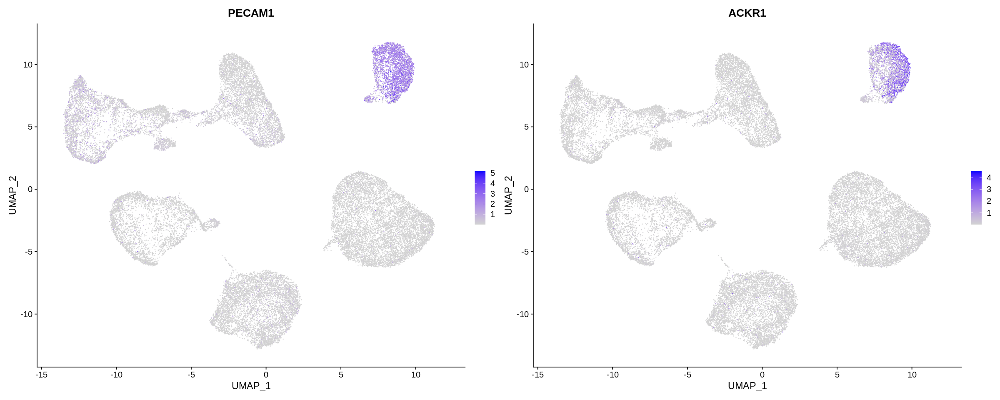

In [30]:
FeaturePlot(cca.merged.obj, features = c('PECAM1', 'ACKR1'), min.cutoff = "q9")#epithelial 4

Warning message:
“Could not find MS4A1 in the default search locations, found in RNA assay instead”


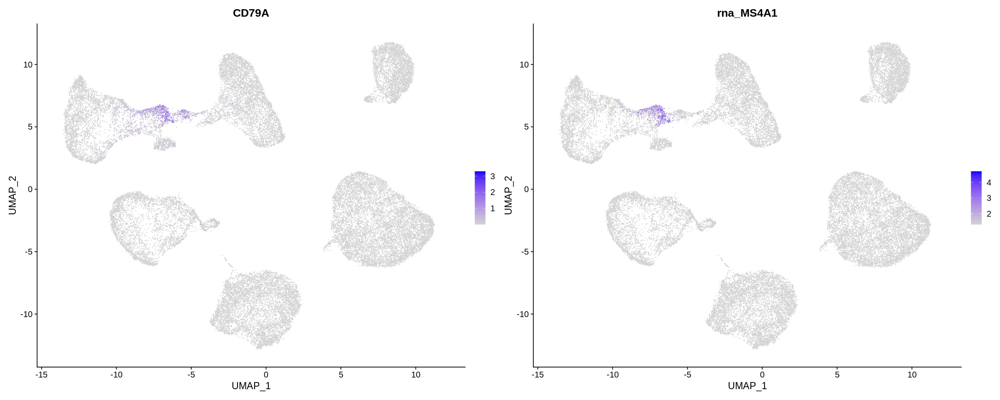

In [31]:
FeaturePlot(cca.merged.obj, features = c('CD79A', 'MS4A1'), min.cutoff = "q9") #b cell 6

In [32]:
Idents(cca.merged.obj)

AAACCTGAGGCAGGTT_1    AAACCTGAGGGAACGG_1    AAACCTGAGGTGATTA_1 
                    0                     4                     1 
   AAACCTGAGTTAACGA_1    AAACCTGCATGTTGAC_1    AAACCTGGTGACTCAT_1 
                    0                     1                     0 
   AAACCTGGTTCAGTAC_1    AAACCTGTCCGCATAA_1    AAACCTGTCGGAAACG_1 
                    5                     1                     1 
   AAACCTGTCGGAAATA_1    AAACGGGAGGTAAACT_1    AAACGGGAGTAGGTGC_1 
                    4                     0                     0 
   AAACGGGCAATAGCGG_1    AAACGGGCATCGATGT_1    AAACGGGCATCGGGTC_1 
                    4                     1                     0 
   AAACGGGGTAAGTGGC_1    AAACGGGGTACTTGAC_1    AAACGGGTCGCTTAGA_1 
                    0                     4                     0 
   AAACGGGTCGGTTCGG_1    AAAGATGAGAATTGTG_1    AAAGATGAGAGTAAGG_1 
                    0                     0                     4 
   AAAGATGAGGAGCGTT_1    AAAGATGCAAGAAGAG_1    AAAGATGCACGGACAA_1 
                    0                     4                     1 
   AAAGATGCAGCCTATA_1    AAAGATGTCCTAGAAC_1    AAAGATGTCGTTTAGG_1 
                    0                     0                     0 
   AAAGATGTCTTCGAGA_1    AAAGCAAAGCTCCCAG_1    AAAGCAAAGTGAATTG_1 
                    1                     0                     0 
   AAAGCAACACATTTCT_1    AAAGCAACATTAGCCA_1    AAAGCAAGTACCGCTG_1 
                    0                     0                     0 
   AAAGCAAGTATCAGTC_1    AAAGCAAGTCTTGCGG_1    AAAGCAAGTTCACGGC_1 
                    1                     0                     0 
   AAAGCAATCTGACCTC_1    AAAGTAGAGGCGACAT_1    AAAGTAGCAGGTGCCT_1 
                    0                     0                     1 
   AAAGTAGGTCCAACTA_1    AAAGTAGGTCCGTTAA_1    AAAGTAGGTCTTCGTC_1 
                    0                     4                     0 
   AAAGTAGGTTAGGGTG_1    AAAGTAGTCAGTGTTG_1    AAATGCCAGTGATCGG_1 
                    0                     0                     4 
   AAATGCCAGTTGAGTA_1    AAATGCCAGTTGTAGA_1    AAATGCCCAAACCTAC_1 
                    0                     1                     4 
   AAATGCCCAGGTGGAT_1    AAATGCCGTACCGTTA_1    AAATGCCGTCTAGTGT_1 
                    0                     0                     1 
   AAATGCCGTGTGGTTT_1    AAATGCCGTTCCCTTG_1    AAATGCCTCACCGGGT_1 
                    0                     5                     4 
   AAATGCCTCCGAATGT_1    AACACGTAGAATTGTG_1    AACACGTAGACTTGAA_1 
                    0                     0                     4 
   AACACGTAGGATGCGT_1    AACACGTAGTTTAGGA_1    AACACGTCAAGCGTAG_1 
                    4                     4                     1 
   AACACGTGTAGCAAAT_1    AACACGTGTCAATACC_1    AACACGTGTTTGTTTC_1 
                    1                     1                     0 
   AACACGTTCATAGCAC_1    AACCATGAGTCTCGGC_1    AACCATGCAAACGTGG_1 
                    0                     6                     0 
   AACCATGGTCGGCTCA_1    AACCATGTCATCGATG_1    AACCATGTCCAAACTG_1 
                    4                     0                     0 
   AACCATGTCCAAAGTC_1    AACCGCGCAATCACAC_1    AACCGCGTCCGTTGCT_1 
                    1                     0                     4 
   AACCGCGTCGCTTAGA_1    AACGTTGAGACAGGCT_1    AACGTTGAGCTCCTTC_1 
                    0                     1                     1 
   AACGTTGAGGTTACCT_1    AACGTTGAGTGTGGCA_1    AACGTTGCAAGCGATG_1 
                    2                     2                     2 
   AACGTTGCAAGTCATC_1    AACGTTGGTACCGGCT_1    AACGTTGGTCCAGTGC_1 
                    2                     2                     0 
   AACGTTGGTTGCTCCT_1    AACGTTGTCAGAGACG_1    AACGTTGTCCTTAATC_1 
                    0                     0                     2 
   AACTCAGCAAGTACCT_1    AACTCAGCAGTATGCT_1    AACTCAGGTAGAAGGA_1 
                    4                     0                     3 
   AACTCAGGTCTAAAGA_1    AACTCAGGTGCCTTGG_1    AACTCAGTCTCGTATT_1 
                    0                     0       

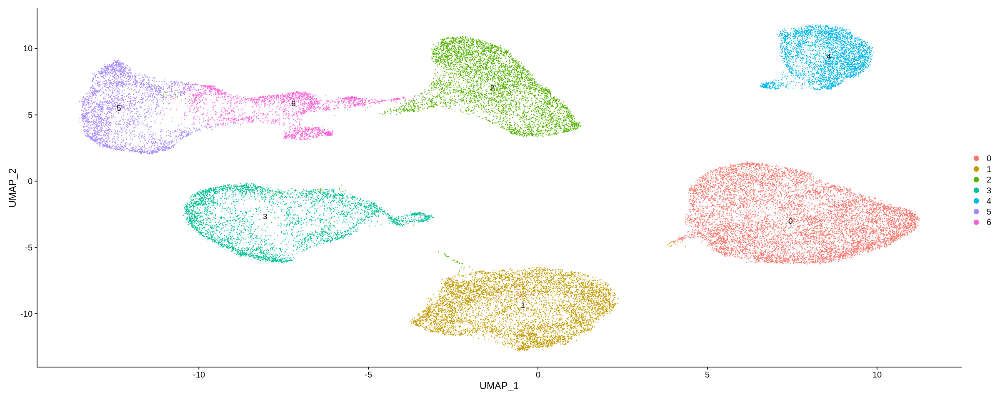

In [33]:


DimPlot(cca.merged.obj, label = TRUE)

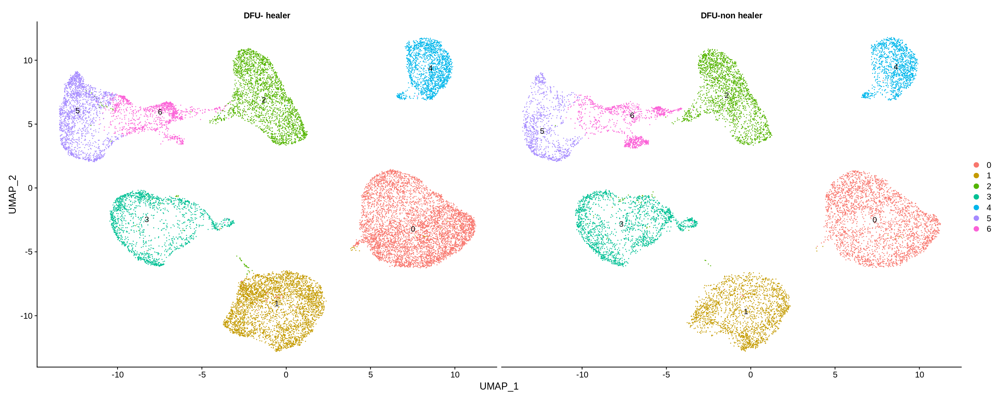

In [34]:
DimPlot(cca.merged.obj, 
               split.by = "major_group", 
        label = TRUE) # Add labels to clusters

In [35]:
top10

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,5.073098,0.993,0.913,0,0,ACTA2
0,4.513836,0.964,0.793,0,0,RGS5
0,4.276443,0.998,0.919,0,0,TAGLN
0,3.560327,0.996,0.911,0,0,MYL9
0,3.359761,0.974,0.811,0,0,NDUFA4L2
0,3.235066,0.987,0.850,0,0,TPM2
0,2.897599,0.965,0.770,0,0,MYLK
0,2.867460,0.986,0.823,0,0,TPM1
0,2.794273,0.958,0.794,0,0,SYNPO2


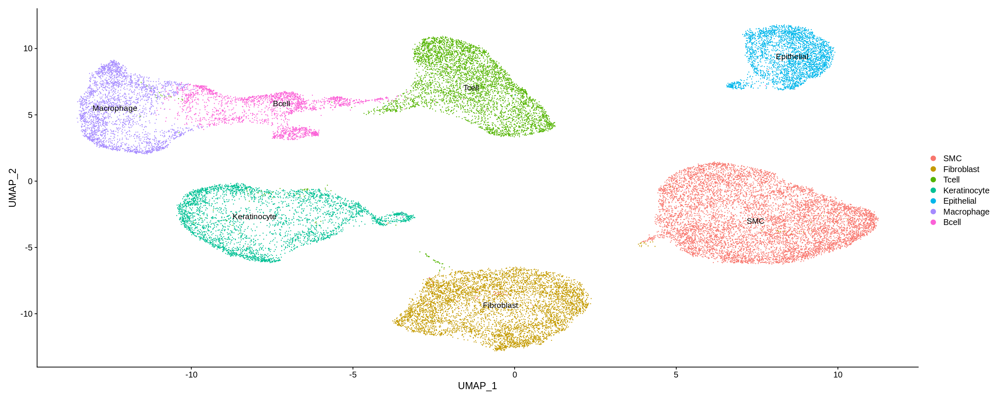

In [49]:
cca.merged.obj_celltype <- RenameIdents( cca.merged.obj,
  `0` = "SMC", `1` = "Fibroblast", `2` = "Tcell",
  `3` = "Keratinocyte", `4` = "Epithelial",
  `5` = "Macrophage", `6` = "Bcell")

DimPlot(cca.merged.obj_celltype, label = TRUE)

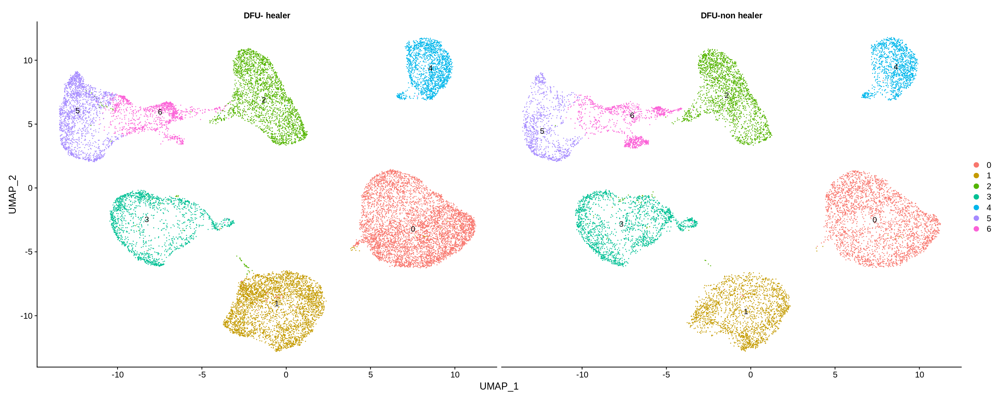

In [50]:
DimPlot(cca.merged.obj, 
               split.by = "major_group", 
        label = TRUE) # Add labels to clusters

In [52]:
cluster_counts <- table(cca.merged.obj$seurat_clusters, cca.merged.obj$major_group)


In [37]:
print(cluster_counts)

   
    DFU- healer DFU-non healer
  0        5148           2799
  1        3632           2001
  2        2421           2009
  3        1623           1870
  4        1674           1288
  5        1789            951
  6        1089           1025


In [53]:
cluster_counts <- table(cca.merged.obj$seurat_clusters, cca.merged.obj$orig.ident)


In [39]:
print(cluster_counts)

   
    GSM5050523_DFU- healer GSM5050527_DFU- healer GSM5050530_DFU-non healer
  0                   1399                    784                       361
  1                    725                    468                        93
  2                    284                     81                       435
  3                     51                     42                       105
  4                    319                    103                       246
  5                     81                    291                        49
  6                     52                    135                       488
   
    GSM5050531_DFU- healer GSM5050532_DFU- healer GSM5050533_DFU-non healer
  0                    193                    243                       746
  1                    214                    638                       817
  2                    307                    126                       115
  3                     82                     11                      1370
  4 

In [40]:
install.packages("writexl")
library("writexl")


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [41]:
# Assuming cluster_counts is a table or matrix
# Convert it to a data frame
cluster_counts_df <- as.data.frame(cluster_counts)


# Specify the file path
file_path <- "/data2/ZenNa/DFU_Project/Result/cellcount2.xlsx"

# Write the data frame to an Excel file
write_xlsx(cluster_counts_df, path = file_path)


In [42]:
file_path2 <- "/data2/ZenNa/DFU_Project/Result/top10.xlsx"
write_xlsx(top10, path = file_path2)



In [43]:
install.packages("ggplot2")
install.packages("patchwork")
install.packages("reshape2")
install.packages("ggpubr")
install.packages("DT")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [44]:

library(ggplot2)
library(patchwork)
library(reshape2)
library(reshape2)
library(ggpubr)

In [56]:
head(cca.merged.obj)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,integrated_snn_res.0.2,seurat_clusters,major_group
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<fct>,<chr>
AAACCTGAGGCAGGTT_1,GSM5050523_DFU- healer,2224,1016,4.181655,DFU- healer,0,0,DFU- healer
AAACCTGAGGGAACGG_1,GSM5050523_DFU- healer,3218,1460,5.189559,DFU- healer,4,4,DFU- healer
AAACCTGAGGTGATTA_1,GSM5050523_DFU- healer,1785,966,4.537815,DFU- healer,1,1,DFU- healer
AAACCTGAGTTAACGA_1,GSM5050523_DFU- healer,2545,1367,3.536346,DFU- healer,0,0,DFU- healer
AAACCTGCATGTTGAC_1,GSM5050523_DFU- healer,2019,972,4.061417,DFU- healer,1,1,DFU- healer
AAACCTGGTGACTCAT_1,GSM5050523_DFU- healer,3253,1342,2.981863,DFU- healer,0,0,DFU- healer
AAACCTGGTTCAGTAC_1,GSM5050523_DFU- healer,3456,1080,3.559028,DFU- healer,5,5,DFU- healer
AAACCTGTCCGCATAA_1,GSM5050523_DFU- healer,6744,2205,3.825623,DFU- healer,1,1,DFU- healer
AAACCTGTCGGAAACG_1,GSM5050523_DFU- healer,3763,1510,2.870050,DFU- healer,1,1,DFU- healer


In [57]:
C1_Fibroblast <- FindMarkers(cca.merged.obj,ident.1="1",idents.2=2,logfc.threshold = 0.25, min.pct = 0.1)


In [58]:
C1_Fibroblast

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCL4,0,-2.0143057,0.519,0.705,0
HLA-DRA,0,-3.6650806,0.515,0.745,0
GNLY,0,-0.5359129,0.259,0.620,0
PTGDS,0,2.3659875,0.880,0.475,0
COMP,0,3.9680532,0.956,0.741,0
CXCL14,0,1.9804703,0.907,0.722,0
CD74,0,-4.0871108,0.502,0.824,0
HLA-DPB1,0,-2.2559723,0.523,0.705,0
SFRP4,0,1.8612315,0.781,0.656,0


In [59]:
options(stringsAsFactors = F)

In [141]:
C1 <- read.table("/data2/ZenNa/DFU_Project/Result/C1_Fibroblast.csv",header=T,sep = ",",row.names = 1)


In [61]:
nrDEG= C1

In [62]:
head(nrDEG)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCL4,0,-2.0143057,0.519,0.705,0
HLA-DRA,0,-3.6650806,0.515,0.745,0
GNLY,0,-0.5359129,0.259,0.620,0
PTGDS,0,2.3659875,0.880,0.475,0
COMP,0,3.9680532,0.956,0.741,0
CXCL14,0,1.9804703,0.907,0.722,0


In [63]:
attach(nrDEG)

In [64]:
df=nrDEG

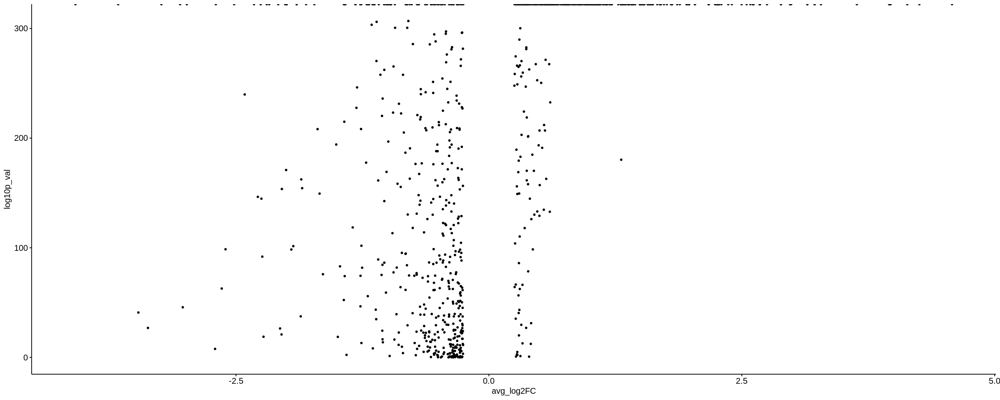

In [65]:
df$log10p_val= -log10(p_val) 
ggscatter(df, x = "avg_log2FC", y = "log10p_val",size=1.0)
df$g=ifelse(df$p_val>0.01,'stable', 
            ifelse( df$avg_log2FC >1,'up', 
                    ifelse( df$avg_log2FC < -1,'down','stable') )
)

In [66]:
table(df$g)


  down stable     up 
    99    633    123 

In [67]:
df$name=rownames(df)
head(df)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,log10p_val,g,name
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
CCL4,0,-2.0143057,0.519,0.705,0,Inf,down,CCL4
HLA-DRA,0,-3.6650806,0.515,0.745,0,Inf,down,HLA-DRA
GNLY,0,-0.5359129,0.259,0.620,0,Inf,stable,GNLY
PTGDS,0,2.3659875,0.880,0.475,0,Inf,up,PTGDS
COMP,0,3.9680532,0.956,0.741,0,Inf,up,COMP
CXCL14,0,1.9804703,0.907,0.722,0,Inf,up,CXCL14


In [84]:
cluster_indices <- which(cca.merged.obj$seurat_clusters == "1")
cluster_data <- cca.merged.obj[cluster_indices, ]


Warning message in subset.Assay(x = x[[assay]], cells = cells, features = assay.features):
“NAs passed in the features vector, removing NAs”
Warning message in subset.Assay(x = x[[assay]], cells = cells, features = assay.features):
“NAs passed in the features vector, removing NAs”


In [92]:
head(cca.merged.obj)


,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,integrated_snn_res.0.2,seurat_clusters,major_group
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<fct>,<chr>
AAACCTGAGGCAGGTT_1,GSM5050523_DFU- healer,2224,1016,4.181655,DFU- healer,0,0,DFU- healer
AAACCTGAGGGAACGG_1,GSM5050523_DFU- healer,3218,1460,5.189559,DFU- healer,4,4,DFU- healer
AAACCTGAGGTGATTA_1,GSM5050523_DFU- healer,1785,966,4.537815,DFU- healer,1,1,DFU- healer
AAACCTGAGTTAACGA_1,GSM5050523_DFU- healer,2545,1367,3.536346,DFU- healer,0,0,DFU- healer
AAACCTGCATGTTGAC_1,GSM5050523_DFU- healer,2019,972,4.061417,DFU- healer,1,1,DFU- healer
AAACCTGGTGACTCAT_1,GSM5050523_DFU- healer,3253,1342,2.981863,DFU- healer,0,0,DFU- healer
AAACCTGGTTCAGTAC_1,GSM5050523_DFU- healer,3456,1080,3.559028,DFU- healer,5,5,DFU- healer
AAACCTGTCCGCATAA_1,GSM5050523_DFU- healer,6744,2205,3.825623,DFU- healer,1,1,DFU- healer
AAACCTGTCGGAAACG_1,GSM5050523_DFU- healer,3763,1510,2.870050,DFU- healer,1,1,DFU- healer


In [109]:
fibroblast_data <- cca.merged.obj[cca.merged.obj$seurat_clusters == '1',]

ERROR: Error in `[.Seurat`(cca.merged.obj, cca.merged.obj$seurat_clusters == : Incorrect number of logical values provided to subset features


In [93]:

healer_group <- fibroblast_data[fibroblast_data$major_group == "DFU_healer", ]
non_healer_group <- fibroblast_data[fibroblast_data$major_group == "DFU_ non healer", ]


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'i' in selecting a method for function '[': Cannot find 'group' in this Seurat object


In [110]:
Fibroblast_Macrophage <- FindMarkers(cca.merged.obj,ident.1="1",idents.2="5",logfc.threshold = 0.25, min.pct = 0.1) #cell interesting


In [123]:
Fibroblast_Macrophage

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCL4,0,-2.0143057,0.519,0.705,0
HLA-DRA,0,-3.6650806,0.515,0.745,0
GNLY,0,-0.5359129,0.259,0.620,0
PTGDS,0,2.3659875,0.880,0.475,0
COMP,0,3.9680532,0.956,0.741,0
CXCL14,0,1.9804703,0.907,0.722,0
CD74,0,-4.0871108,0.502,0.824,0
HLA-DPB1,0,-2.2559723,0.523,0.705,0
SFRP4,0,1.8612315,0.781,0.656,0


In [131]:
options(stringsAsFactors = FALSE)


In [155]:
output_file <- "/data2/ZenNa/DFU_Project/Result/Fibroblast_Macrophage.csv"
write.csv(Fibroblast_Macrophage, file = output_file, row.names = TRUE)

In [156]:
input_file <- "/data2/ZenNa/DFU_Project/Result/Fibroblast_Macrophage.csv"
C1_2 <- read.table(input_file, header=TRUE, sep = ",", row.names = 1)

In [157]:
nrDEG= C1_2

In [158]:
df=nrDEG

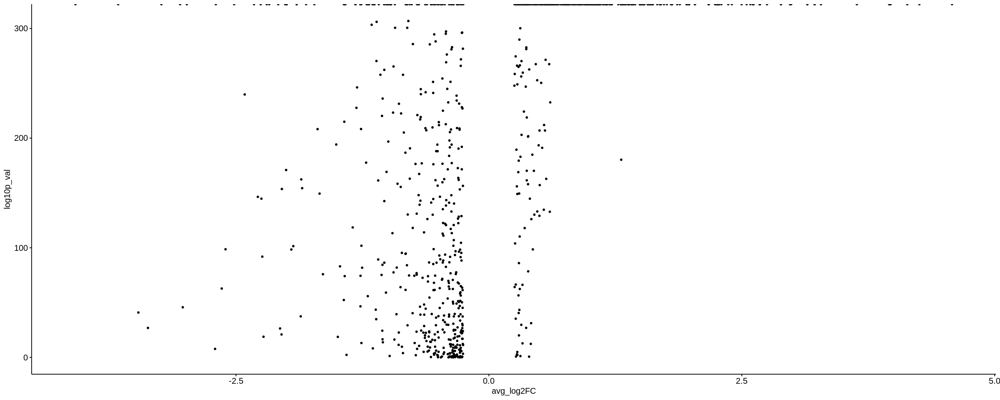

In [159]:
df$log10p_val= -log10(p_val) 
ggscatter(df, x = "avg_log2FC", y = "log10p_val",size=1.0)
df$g=ifelse(df$p_val>0.01,'stable', 
            ifelse( df$avg_log2FC >1,'up', 
                    ifelse( df$avg_log2FC < -1,'down','stable') )
)

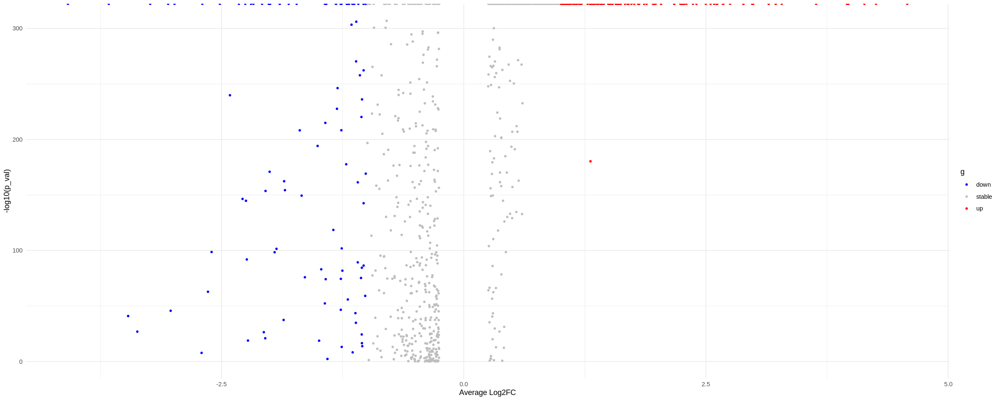

In [160]:
# Assuming you have the 'df' data frame with columns 'avg_log2FC' and 'p_val'

# Calculate the negative logarithm (base 10) of 'p_val' and store it in 'log10p_val'
df$log10p_val <- -log10(df$p_val)

# Define a new column 'g' based on conditions
df$g <- ifelse(df$p_val > 0.01, 'stable', 
               ifelse(df$avg_log2FC > 1, 'up', 
                      ifelse(df$avg_log2FC < -1, 'down', 'stable')))

# Load the ggplot2 library if it's not already installed
# install.packages("ggplot2")
library(ggplot2)

# Create a scatter plot using ggscatter
ggplot(df, aes(x = avg_log2FC, y = log10p_val, color = g)) +
  geom_point(size = 1.0) +
  labs(x = "Average Log2FC", y = "-log10(p_val)") +
  scale_color_manual(values = c('stable' = 'gray', 'up' = 'red', 'down' = 'blue')) +
  theme_minimal()


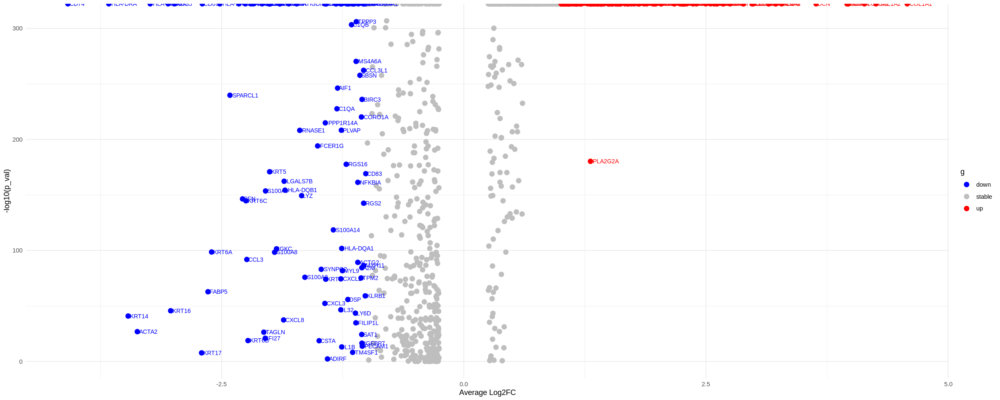

In [170]:
# Calculate the negative logarithm (base 10) of 'p_val' and store it in 'log10p_val'
df$log10p_val <- -log10(df$p_val)

# Define a new column 'g' based on conditions
df$g <- ifelse(df$p_val > 0.01, 'stable', 
               ifelse(df$avg_log2FC > 1, 'up', 
                      ifelse(df$avg_log2FC < -1, 'down', 'stable')))

# Load the ggplot2 library if it's not already installed
# install.packages("ggplot2")
library(ggplot2)

# Create a scatter plot using ggplot
scatter_plot <- ggplot(df, aes(x = avg_log2FC, y = log10p_val, color = g)) +
  geom_point(size = 3) +  # Increase the point size
  labs(x = "Average Log2FC", y = "-log10(p_val)") +
  scale_color_manual(values = c('stable' = 'gray', 'up' = 'red', 'down' = 'blue')) +
  theme_minimal()

# Add labels only for upregulated and downregulated genes
scatter_plot <- scatter_plot +
  geom_text(data = subset(df, g %in% c('up', 'down')), aes(label = rownames(subset(df, g %in% c('up', 'down')))),
            hjust = -0.1, vjust = 0.5, size = 3)

# Print the scatter plot
print(scatter_plot)


In [171]:
p1 <- scatter_plot

In [174]:
ggsave("/data2/ZenNa/DFU_Project/Result/Volcanoplot_Fibmac.png", p1, dpi = 600,  width = 10, height = 8)

In [175]:
df$name=rownames(df)
head(df)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,log10p_val,g,name
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
CCL4,0,-2.0143057,0.519,0.705,0,Inf,down,CCL4
HLA-DRA,0,-3.6650806,0.515,0.745,0,Inf,down,HLA-DRA
GNLY,0,-0.5359129,0.259,0.620,0,Inf,stable,GNLY
PTGDS,0,2.3659875,0.880,0.475,0,Inf,up,PTGDS
COMP,0,3.9680532,0.956,0.741,0,Inf,up,COMP
CXCL14,0,1.9804703,0.907,0.722,0,Inf,up,CXCL14


In [180]:
write.csv(df, file = "/data2/ZenNa/DFU_Project/Result/Fibro_Mac_DF.csv", row.names = TRUE, quote = TRUE)